In [2]:
from scipy.stats import invgamma
import pandas as pd
import numpy as np
import numpy.typing
from scipy import stats
import matplotlib.pyplot as plt
from tqdm import tqdm

import os
from scipy.linalg import eigh
from scipy.special import gammainc, gamma
from dataclasses import dataclass
import pickle
from scipy.stats import circmean
import os
import numpy as np
import numpy.typing
from scipy import stats
import matplotlib.pyplot as plt
from tqdm import tqdm

from sampler import sample

pi = np.pi 

# File name
file_name = "DG_2019_03_10.csv"

# Define the folder path for saving processed data
folder_path = "C:\\Users\\97252\\Desktop\\vMQP_final\\vMQP"  # Specify your folder path here


## Import and arrange Data ##
#############################
seed = 18
np.random.seed(seed)
print("seed: ", seed)
#np.random.seed(80)
# Set the transparency level
alpha = 0.2  # Adjust this value to control the transparency (0 is fully transparent, 1 is fully opaque)



# Define precision and file names
prec = 0.2
one_stamp_name =  "OBS_DEU_PT1H_DD2.csv"

save_file = "C:\\Users\\97252\\Desktop\\vMQP_final\\vMQP\\wind_experiment.csv"

# Function to parse point from string to float
def parse_point(point_str):
    point = point_str.strip('POINT ()').split()
    return float(point[0]), float(point[1])

# Define file paths
file_path_one = os.path.join(folder_path, one_stamp_name)

# Load data from CSV files
data = pd.read_csv(file_path_one)



# Sample test set
data_shape = data.shape[0]
test_size = int(prec * data_shape)
test_ind = np.random.choice(data_shape, size=test_size, replace=False)
train_ind = np.setdiff1d(np.arange(data_shape), test_ind)
ind_un = test_ind
ind_obs = train_ind    







# Create necessary arrays for further use
combined_xs = data[['Longitude', 'Latitude']].values # All locations
xs = combined_xs[ind_obs,:] # Train locations
pred_xs = combined_xs[ind_un,:] # Test locations


ys_all = data['dir2'].values # All observed locations
ys = ys_all[ind_obs] # Train observed values
test_ys = ys_all[ind_un] # Test observed values

xs_obs = xs
d = combined_xs.shape[0]
Nsamples = 10000
samples = np.zeros([d,Nsamples])
du=test_ys.shape[0]



seed:  18


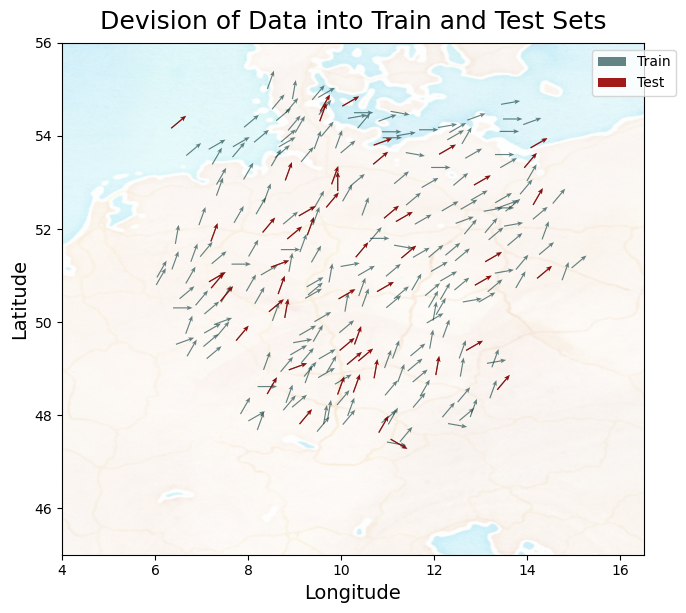

Test indices: [207 168 163 115  17 210 203 149   9 103 143 215  56 109 184 118  57  33
  41 227 154 259  39  40 161 125 214 208 217  24  94 126  81 198 110 196
   0  95  47 158 221  16 128  74 112 127   3 177   6  50 228 212]
Train indices: [  1   2   4   5   7   8  10  11  12  13  14  15  18  19  20  21  22  23
  25  26  27  28  29  30  31  32  34  35  36  37  38  42  43  44  45  46
  48  49  51  52  53  54  55  58  59  60  61  62  63  64  65  66  67  68
  69  70  71  72  73  75  76  77  78  79  80  82  83  84  85  86  87  88
  89  90  91  92  93  96  97  98  99 100 101 102 104 105 106 107 108 111
 113 114 116 117 119 120 121 122 123 124 129 130 131 132 133 134 135 136
 137 138 139 140 141 142 144 145 146 147 148 150 151 152 153 155 156 157
 159 160 162 164 165 166 167 169 170 171 172 173 174 175 176 178 179 180
 181 182 183 185 186 187 188 189 190 191 192 193 194 195 197 199 200 201
 202 204 205 206 209 211 213 216 218 219 220 222 223 224 225 226 229 230
 231 232 233 234 235 236 237 

In [4]:



###########################
#### Plot Test \ Train ####
###########################

img = plt.imread("germanyMap1.png")


bins = 50
scale = 30
headlength2 = 5
headwidth2 = 4
width2 = 0.002
headaxislength2 = headlength2 - 1



#################
## Quiver Plot ##
#################

fig, ax = plt.subplots(figsize=(7, 10))

# Define softer colors
Teal =  (0.0, 0.2, 0.2)   # Darker teal
dark_red = (0.6, 0.0, 0.0)   # Dark red

# Plot observed and predicted wind directions with softer colors
ax.quiver(combined_xs[:, 0], combined_xs[:, 1], np.cos(ys_all), -np.sin(ys_all), color=Teal, alpha=0.6, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2, scale=scale)
ax.quiver(combined_xs[ind_un, 0], combined_xs[ind_un, 1], np.cos(ys_all[ind_un]), -np.sin(ys_all[ind_un]), color=dark_red, alpha=0.9, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2, scale=scale)

# Plot map
ax.imshow(img, extent=[4, 16.5, 45, 56], alpha=alpha)

# Set plot title and labels
ax.set_title("Devision of Data into Train and Test Sets", fontsize=18
             ,  pad=10)  # Adjusted font size
ax.title.set_position([.5, 1.9])
ax.legend(['Train', 'Test'], loc='upper left', bbox_to_anchor=(0.9, 1))
ax.set_xlabel('Longitude', fontsize=14)  # Adjusted font size
ax.set_ylabel('Latitude', fontsize=14)   # Adjusted font size

# Show plot
plt.tight_layout()
plt.show()

# Print information about the test and train indices
print(f"Test indices: {ind_un}")
print(f"Train indices: {ind_obs}")

## R code for dist Matrix ##
############################


    

def rose_plot(ax, angles, bins=32, density=None, offset=np.pi/2, lab_unit="degrees",
              start_zero=False, **param_dict):
    
    """
    Plot polar histogram of angles on ax. ax must have been created using
    subplot_kw=dict(projection='polar'). Angles are expected in radians.
    """
    # Wrap angles to [-pi, pi)
    #angles = (angles + np.pi) % (2*np.pi) - np.pi

    # Set bins symetrically around zero
    if start_zero:
        # To have a bin edge at zero use an even number of bins
        if bins % 2:
            bins += 1
        bins = np.linspace(-np.pi, np.pi, num=bins+1)

    # Bin data and record counts
    count, bin = np.histogram(angles, bins=bins)

    # Compute width of each bin
    widths = np.diff(bin)

    # By default plot density (frequency potentially misleading)
    if density is None or density is True:
        # Area to assign each bin
        area = count / angles.size
        # Calculate corresponding bin radius
        radius = (area / np.pi)**.5
    else:
        radius = count

    # Plot data on ax
    ax.bar(bin[:-1], radius, zorder=1, align='edge', width=widths,
           edgecolor='C0', fill=False, linewidth=1)

    # Set the direction of the zero angle
    ax.set_theta_offset(offset)

    # Remove ylabels, they are mostly obstructive and not informative
    ax.set_yticks([])

    if lab_unit == "radians":
        label = ['$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$',
                  r'$\pi$', r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$']
        ax.set_xticklabels(label)
        



In [5]:
# Assume combined_xs, test_ys, and ys are already defined elsewhere
xs_obs = combined_xs
d = combined_xs.shape[0]
Nsamples = 100000
samples = np.zeros([d, Nsamples])
du = test_ys.shape[0]
i0 = 1000
i=None
samples=None

In [7]:
import numpy as np
import pandas as pd
import os
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm
import logging
from sampler import sample


# Set up directory for saving samples
samples_dir = './samples_calm/'
os.makedirs(samples_dir, exist_ok=True)


@dataclass
class MCMC_Parameters:
    sigma2_l1: float = 0.05
    sigma2_l2: float = 1
    sigma2_kappa: float = 0.5

    sigma_prop_l1: float = 0.01
    sigma_prop_l2: float = 0.0005
    sigma_prop_kappa: float = 0.01
    sigma_prop_nu: float = 0.01

    N_thetap: int = 300
    discard: int = 0
    N_theta: int = 500
    tqdm_disable: bool = True

    l10: float = 0.1
    l20: float = 0.5

    bridging: bool = True
    K: int = 3
    Geweke: bool = False



# Initialize MCMC parameters
pars = MCMC_Parameters()

samples, i, acc = sample(Nsamples, pars, xs_obs, ind_obs, ys, i=i, samples=samples)

samples_filename = f'{samples_dir}/samples_wind.pkl'
with open(samples_filename, 'wb') as f:
    pickle.dump(samples, f, pickle.HIGHEST_PROTOCOL)

par_filename = f'{samples_dir}/params_wind.pkl'
with open(par_filename, 'wb') as f:
    pickle.dump(pars, f, pickle.HIGHEST_PROTOCOL)




  1%|          | 929/96927 [01:41<2:55:00,  9.14it/s]

 accept rate: 0.464


  2%|▏         | 1929/96927 [03:39<2:55:56,  9.00it/s]

 accept rate: 0.536


  3%|▎         | 2929/96927 [05:32<2:56:12,  8.89it/s]

 accept rate: 0.504


  4%|▍         | 3929/96927 [07:38<3:11:53,  8.08it/s]

 accept rate: 0.525


  5%|▌         | 4929/96927 [09:32<2:50:56,  8.97it/s]

 accept rate: 0.505


  6%|▌         | 5929/96927 [11:26<2:58:14,  8.51it/s]

 accept rate: 0.448


  7%|▋         | 6929/96927 [13:18<2:50:05,  8.82it/s]

 accept rate: 0.475


  8%|▊         | 7929/96927 [15:09<2:41:43,  9.17it/s]

 accept rate: 0.436


  9%|▉         | 8929/96927 [17:06<2:39:54,  9.17it/s]

 accept rate: 0.49


 10%|█         | 9929/96927 [18:58<2:33:25,  9.45it/s]

 accept rate: 0.47


 11%|█▏        | 10929/96927 [20:48<2:53:09,  8.28it/s]

 accept rate: 0.439


 12%|█▏        | 11930/96927 [22:37<2:32:07,  9.31it/s]

 accept rate: 0.476


 13%|█▎        | 12929/96927 [24:27<2:32:36,  9.17it/s]

 accept rate: 0.465


 14%|█▍        | 13929/96927 [26:19<2:33:07,  9.03it/s]

 accept rate: 0.454


 15%|█▌        | 14929/96927 [28:08<2:41:33,  8.46it/s]

 accept rate: 0.463


 16%|█▋        | 15929/96927 [30:01<2:27:47,  9.13it/s]

 accept rate: 0.458


 17%|█▋        | 16565/96927 [31:13<2:31:28,  8.84it/s]


Returned
mean_acc 0.47654693631150014


In [13]:
angles = samples.angles

angles.shape 

(260, 10000)

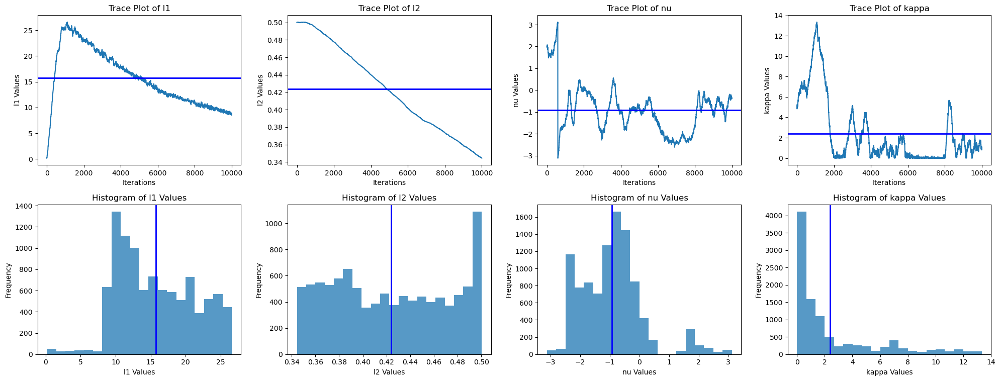

  0%|          | 0/52 [00:00<?, ?it/s]


NameError: name 'testPredVonMises_10th_row' is not defined

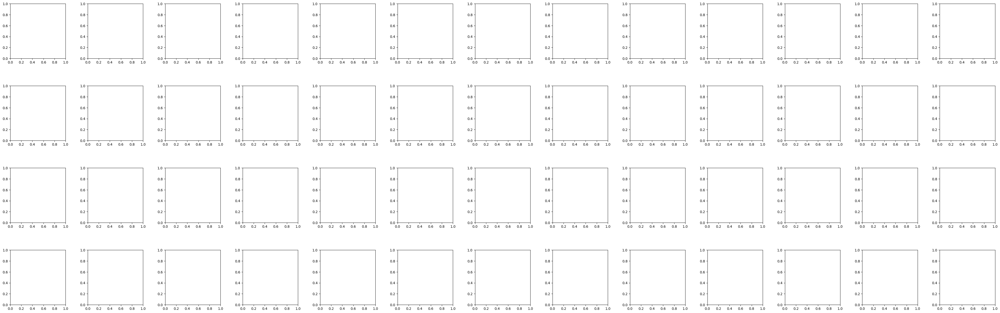

In [ ]:
#### Plot Map Von Mises ####
############################
## CRPS Von Mises ##
####################

# Von Mises Traces circular hists
N_burnin = 1000



bins=20
num_rows = 4  # Number of rows in the grid
num_cols = 13   # Number of columns in the grid


def rose_plot(ax, angles, bins=32, density=None, offset=np.pi*0.5, lab_unit="degrees",
              start_zero=False, **param_dict):
    
    """
    Plot polar histogram of angles on ax. ax must have been created using
    subplot_kw=dict(projection='polar'). Angles are expected in radians.
    """
    # Wrap angles to [-pi, pi)
    #angles = (angles + np.pi) % (2*np.pi) - np.pi

    # Set bins symetrically around zero
    if start_zero:
        # To have a bin edge at zero use an even number of bins
        if bins % 2:
            bins += 1
        bins = np.linspace(-np.pi, np.pi, num=bins+1)

    # Bin data and record counts
    count, bin = np.histogram(angles, bins=bins)

    # Compute width of each bin
    widths = np.diff(bin)

    # By default plot density (frequency potentially misleading)
    if density is None or density is True:
        # Area to assign each bin
        area = count / angles.size
        # Calculate corresponding bin radius
        radius = (area / np.pi)**.5
    else:
        radius = count

    # Plot data on ax
    ax.bar(bin[:-1], radius, zorder=1, align='edge', width=widths,
           edgecolor='C0', fill=False, linewidth=1)

    # Set the direction of the zero angle
    ax.set_theta_offset(offset)

    # Remove ylabels, they are mostly obstructive and not informative
    ax.set_yticks([])

    if lab_unit == "radians":
        label = ['$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$',
                  r'$\pi$', r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$']
        ax.set_xticklabels(label)
        

fig, axs = plt.subplots(2, 4, figsize=(20, 8))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Trace of l1
axes = axs[0, 0]
axes.plot(samples.l1s[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('l1 Values')
axes.set_title('Trace Plot of l1')
axes.axhline(np.mean(samples.l1s[:i]), color='b', linewidth=2)


# Trace of l2
axes = axs[0, 1]
axes.plot(samples.l2s[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('l2 Values')
axes.set_title('Trace Plot of l2')
axes.axhline(np.mean(samples.l2s[:i]), color='b', linewidth=2)




# Histogram of l1

axes = axs[1, 0]
axes.hist(samples.l1s[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.l1s[:i]), color='b', linewidth=2)
axes.set_xlabel('l1 Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of l1 Values')

# Histogram of l2
axes = axs[1, 1]
axes.hist(samples.l2s[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.l2s[:i]), color='b', linewidth=2)
axes.set_xlabel('l2 Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of l2 Values')



# Trace and histogram of kappas
axes = axs[0, 3]
axes.plot(samples.kappas[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('kappa Values')
axes.set_title('Trace Plot of kappa')
axes.axhline(np.mean(samples.kappas[:i]), color='b', linewidth=2)

axes = axs[1, 3]
axes.hist(samples.kappas[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.kappas[:i]), color='b', linewidth=2)
axes.set_xlabel('kappa Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of kappa Values')

# Trace and histogram of nus
axes = axs[0, 2]
axes.plot(samples.nus[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('nu Values')
axes.set_title('Trace Plot of nu')
axes.axhline(np.mean(samples.nus[:i]), color='b', linewidth=2)

axes = axs[1, 2]
axes.hist(samples.nus[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.nus[:i]), color='b', linewidth=2)
axes.set_xlabel('nu Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of nu Values')


plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()






fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in tqdm(range(len(axs))):
    axs[p].plot(testPredVonMises_10th_row[p,:])  # Plot data for the i-th dimension
    axs[p].set_xlabel('Iterations')
    #axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')  
    # add bar to show the observed direction
    axs[p].axhline(test_ys[p], color='black', linewidth=1)  

    #axs[p].set_title(f'dim {p+1}, CRPS = {CRPS_vec_VM[p,:]}')  # Assuming dimensions are indexed from 1 to 52


plt.show()

fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in tqdm(range(len(axs))):
    axs[p].hist(testPredVonMises_10th_row[p,:], bins = bins)  # Plot data for the i-th dimension
    axs[p].set_xlabel('Iterations')
    #axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')
    # add bar to show the observed direction
    axs[p].axvline(test_ys[p], color='black', linewidth=1)


plt.show()



fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4), subplot_kw=dict(projection='polar'))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in range(len(axs)):
    
    rose_plot(axs[p], testPredVonMises_10th_row[p,:] , lab_unit="radians",bins = bins)
    #axs[p].set_title(f'dim {p+1}, CRPS = {CRPS_vec_VM[p]}')          # Assuming dimensions are indexed from 1 to 52
    # add black quivar of the observed direction
    axs[p].quiver(0,0,np.sin(test_ys[p]), np.cos(test_ys[p]), color='black', scale=1, scale_units='xy', angles='xy')
    #axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')



plt.tight_layout()  # Adjust layout to prevent overlap of subplots

plt.show()

import matplotlib.font_manager as font_manager

img = plt.imread("germanyMap4.png")

bins = 50

scale = 25
headlength2 = 5
headwidth2 = 4
width2 = 0.002
headaxislength2 = headlength2 - 1



#################
## Quiver Plot ###
#################

# Define softer colors
dteal =  (0.0, 0.2, 0.2)   # Darker teal
dark_red = (0.6, 0.0, 0.0)   # Dark red
# ligt teal
lteal =  (0.1, 0.5, 0.5)   # Darker teal


alpha_img = 0.2

fig, ax = plt.subplots(figsize=(10, 15))
#dark = '#1f77b4'

ax.quiver(combined_xs[ind_obs, 0], combined_xs[ind_obs, 1], observed_directions[ind_obs].real, observed_directions[ind_obs].imag, color=lteal, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2 , scale=scale)

ax.quiver(combined_xs[ind_un, 0], combined_xs[ind_un, 1], observed_directions[ind_un].real, observed_directions[ind_un].imag, color=dteal, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2 , scale=scale)

ax.quiver(combined_xs[ind_un, 0], combined_xs[ind_un, 1], predicted_directions_VM.real, predicted_directions_VM.imag, color=dark_red,headaxislength=headaxislength2, headwidth=headwidth2, width = width2, headlength=headlength2 , scale=scale)


ax.imshow(img, extent=[5.5, 15, 46.5, 55.5], alpha=alpha_img)


legend_font = font_manager.FontProperties(size=14)
#ax.set_title("Observed vs. Predicted Wind Directions", fontsize=18, fontweight='bold', pad=30)  
ax.legend(['Train', 'Test', 'vM Predictions'], loc='upper left', bbox_to_anchor=(0, 1), prop=legend_font)
ax.set_xlabel('Longitude', fontsize=16) 
ax.set_ylabel('Latitude',  fontsize=16) 
ax.set_xlim(5.5, 15)
ax.set_ylim(46.5, 55.5)


plt.show()

In [ ]:
from sampler import sample
@dataclass
class MCMC_Parameters:
    sigma2_l1: float = 1
    sigma2_l2: float = 0.1
    sigma2_kappa: float = 0.01

    sigma_prop_l1: float = 0.05
    sigma_prop_l2: float = 0.00005
    sigma_prop_kappa: float = 0.1
    sigma_prop_nu: float = 0.1

    N_thetap: int = 300
    discard: int = 0
    N_theta: int = 400
    tqdm_disable: bool = True

    l10: float = 5
    l20: float = 0.1

    bridging: bool = True
    K: int = 3
    Geweke: bool = False


# Initialize MCMC parameters
pars = MCMC_Parameters()
# Run MCMC sampling
i = None
samples = None


samples, i, acc = sample(Nsamples, pars, xs_obs, ind_obs, ys, i=i, samples=samples)


samples_filename = f'{samples_dir}/samples_wind_6.pkl'
with open(samples_filename, 'wb') as f:
    pickle.dump(samples, f, pickle.HIGHEST_PROTOCOL)

par_filename = f'{samples_dir}/params_wind_6.pkl'
with open(par_filename, 'wb') as f:
    pickle.dump(pars, f, pickle.HIGHEST_PROTOCOL)



 10%|█         | 1002/10000 [01:27<11:18, 13.26it/s]

 accept rate: 0.434


 20%|██        | 2002/10000 [02:52<12:11, 10.94it/s]

 accept rate: 0.392


 30%|███       | 3002/10000 [04:19<10:08, 11.50it/s]

 accept rate: 0.441


 38%|███▊      | 3752/10000 [05:25<09:02, 11.51it/s]


Returned
mean_acc 0.4189765458422175


NameError: name 'samples_dir' is not defined

result VM:  $CRPSvec
             [,1]
 [1,] 0.078143059
 [2,] 0.021357359
 [3,] 0.077232664
 [4,] 0.036468740
 [5,] 0.193487892
 [6,] 0.048677637
 [7,] 0.037183802
 [8,] 0.001909374
 [9,] 0.087480813
[10,] 0.129705865
[11,] 0.099747956
[12,] 0.022211473
[13,] 0.017606768
[14,] 0.011386059
[15,] 0.023166716
[16,] 0.106762869
[17,] 0.015646574
[18,] 0.486151798
[19,] 0.264480508
[20,] 0.019825438
[21,] 0.120844452
[22,] 1.268749345
[23,] 0.068041866
[24,] 0.153393750
[25,] 0.086883560
[26,] 0.052102820
[27,] 0.061973419
[28,] 0.066182144
[29,] 0.103754172
[30,] 0.107399234
[31,] 0.023000620
[32,] 0.019400565
[33,] 0.194016954
[34,] 0.077861931
[35,] 0.168232173
[36,] 0.043280868
[37,] 0.102316375
[38,] 0.023483040
[39,] 0.170855965
[40,] 0.060409262
[41,] 0.028908878
[42,] 0.185515352
[43,] 0.002267695
[44,] 0.186951582
[45,] 0.005262345
[46,] 0.011075296
[47,] 0.366040453
[48,] 0.023390826
[49,] 0.146573837
[50,] 0.103578869
[51,] 0.036695100
[52,] 0.137570585

$CRPS
[1] 0.1150894


CR

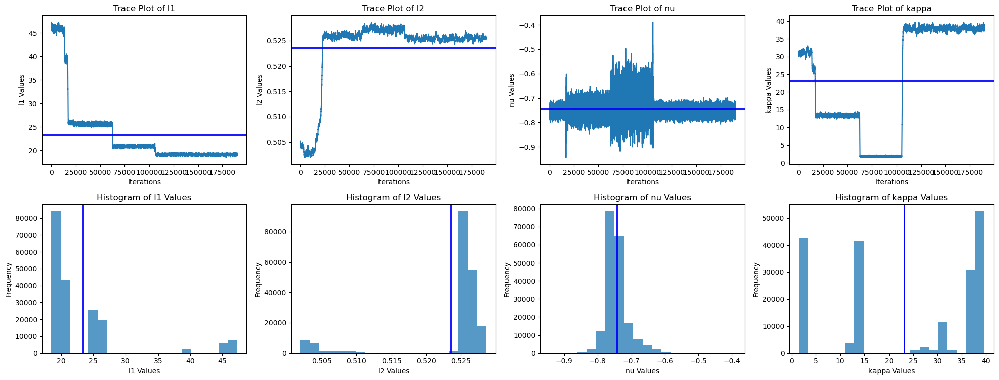

100%|██████████| 52/52 [00:00<00:00, 587.38it/s]


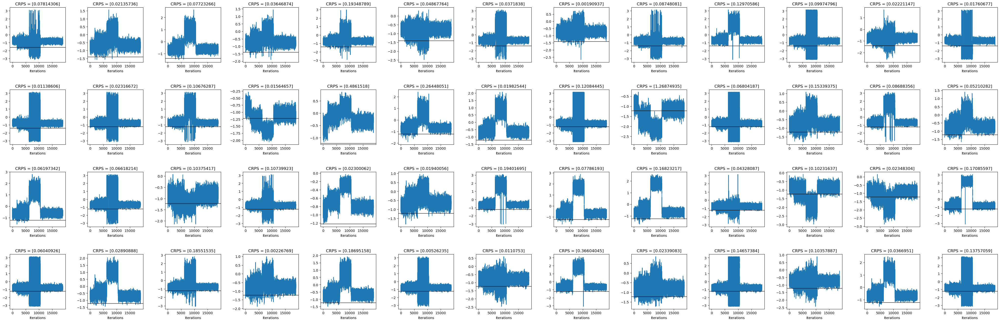

100%|██████████| 52/52 [00:00<00:00, 110.68it/s]


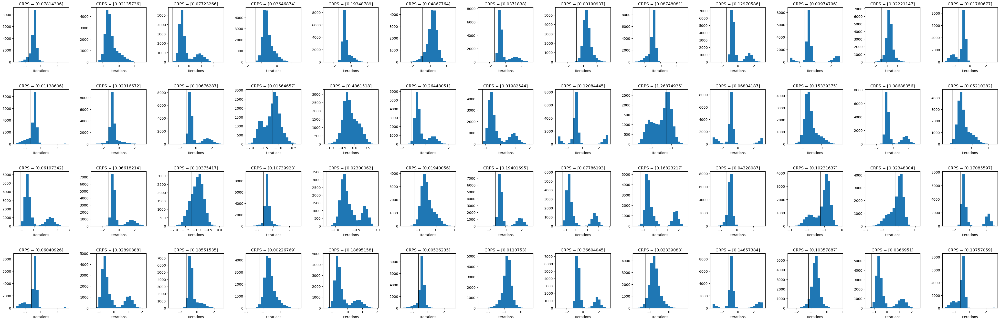

C:\Users\97252\AppData\Local\Temp\ipykernel_2488\1202356080.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(label)


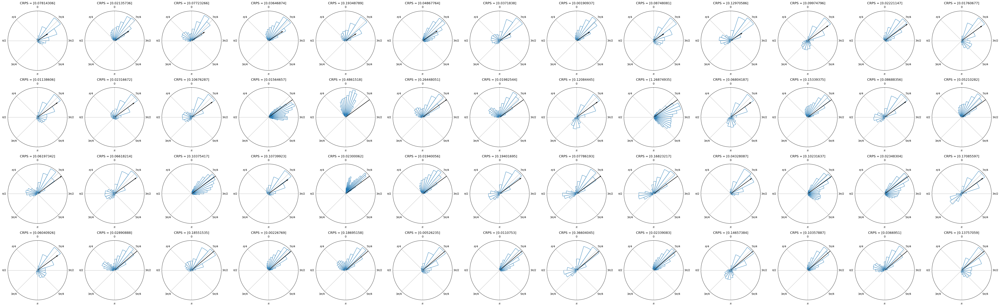

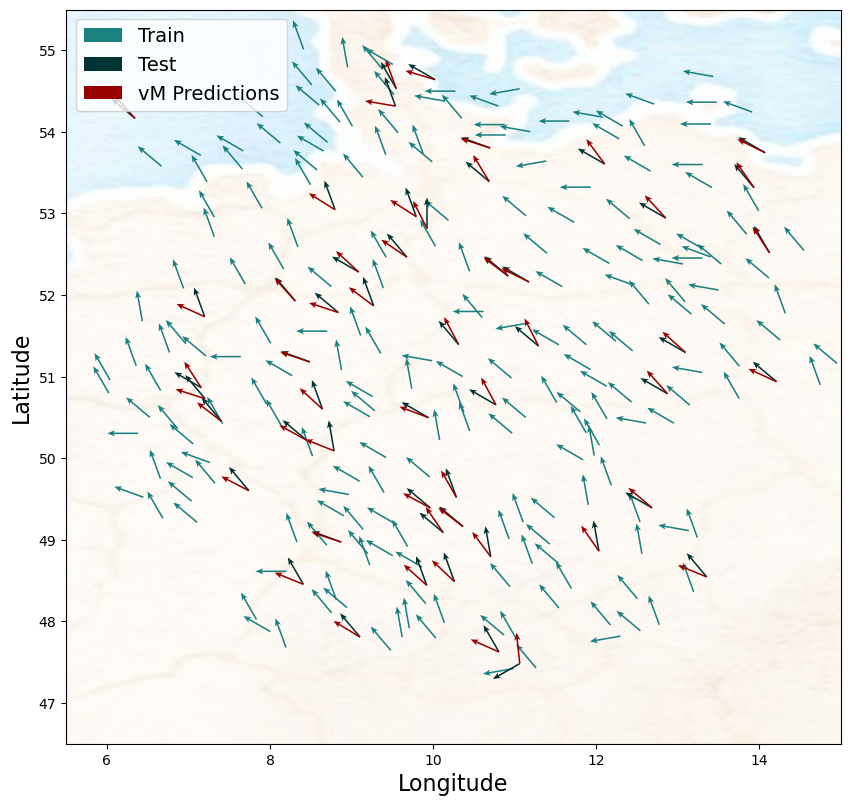

In [ ]:


# Von Mises Traces circular hists
N_burnin = 10000

testPredVonMises = samples.angles[ind_un, N_burnin : i].T
# Extract every 10th row
testPredVonMises_10th_row = testPredVonMises[::10].T 
# CRPScirc function for Von Mises predictions
resultVM = r['CRPScirc'](tYsT_r, testPredVonMises_10th_row, bycol=False)
print("result VM: ", resultVM)
CRPS_vec_VM = resultVM.rx2('CRPS')
print("CRPS VM: ", resultVM.rx2('CRPS'))
CRPS_vec_VM = resultVM.rx2('CRPSvec')
print("Max CRPS VM: ", np.max(resultVM.rx2('CRPSvec')))
test_ys = np.array(ys_all)

bins=20
num_rows = 4  # Number of rows in the grid
num_cols = 13   # Number of columns in the grid


def rose_plot(ax, angles, bins=32, density=None, offset=np.pi*0.5, lab_unit="degrees",
              start_zero=False, **param_dict):
    
    """
    Plot polar histogram of angles on ax. ax must have been created using
    subplot_kw=dict(projection='polar'). Angles are expected in radians.
    """
    # Wrap angles to [-pi, pi)
    #angles = (angles + np.pi) % (2*np.pi) - np.pi

    # Set bins symetrically around zero
    if start_zero:
        # To have a bin edge at zero use an even number of bins
        if bins % 2:
            bins += 1
        bins = np.linspace(-np.pi, np.pi, num=bins+1)

    # Bin data and record counts
    count, bin = np.histogram(angles, bins=bins)

    # Compute width of each bin
    widths = np.diff(bin)

    # By default plot density (frequency potentially misleading)
    if density is None or density is True:
        # Area to assign each bin
        area = count / angles.size
        # Calculate corresponding bin radius
        radius = (area / np.pi)**.5
    else:
        radius = count

    # Plot data on ax
    ax.bar(bin[:-1], radius, zorder=1, align='edge', width=widths,
           edgecolor='C0', fill=False, linewidth=1)

    # Set the direction of the zero angle
    ax.set_theta_offset(offset)

    # Remove ylabels, they are mostly obstructive and not informative
    ax.set_yticks([])

    if lab_unit == "radians":
        label = ['$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$',
                  r'$\pi$', r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$']
        ax.set_xticklabels(label)
        

fig, axs = plt.subplots(2, 4, figsize=(20, 8))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Trace of l1
axes = axs[0, 0]
axes.plot(samples.l1s[N_burnin:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('l1 Values')
axes.set_title('Trace Plot of l1')
axes.axhline(np.mean(samples.l1s[N_burnin:i]), color='b', linewidth=2)


# Trace of l2
axes = axs[0, 1]
axes.plot(samples.l2s[N_burnin:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('l2 Values')
axes.set_title('Trace Plot of l2')
axes.axhline(np.mean(samples.l2s[N_burnin:i]), color='b', linewidth=2)




# Histogram of l1

axes = axs[1, 0]
axes.hist(samples.l1s[N_burnin:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.l1s[N_burnin:i]), color='b', linewidth=2)
axes.set_xlabel('l1 Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of l1 Values')

# Histogram of l2
axes = axs[1, 1]
axes.hist(samples.l2s[N_burnin:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.l2s[N_burnin:i]), color='b', linewidth=2)
axes.set_xlabel('l2 Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of l2 Values')



# Trace and histogram of kappas
axes = axs[0, 3]
axes.plot(samples.kappas[N_burnin:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('kappa Values')
axes.set_title('Trace Plot of kappa')
axes.axhline(np.mean(samples.kappas[N_burnin:i]), color='b', linewidth=2)

axes = axs[1, 3]
axes.hist(samples.kappas[N_burnin:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.kappas[N_burnin:i]), color='b', linewidth=2)
axes.set_xlabel('kappa Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of kappa Values')

# Trace and histogram of nus
axes = axs[0, 2]
axes.plot(samples.nus[N_burnin:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('nu Values')
axes.set_title('Trace Plot of nu')
axes.axhline(np.mean(samples.nus[N_burnin:i]), color='b', linewidth=2)

axes = axs[1, 2]
axes.hist(samples.nus[N_burnin:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.nus[N_burnin:i]), color='b', linewidth=2)
axes.set_xlabel('nu Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of nu Values')


plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()






fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in tqdm(range(len(axs))):
    axs[p].plot(testPredVonMises_10th_row[p,:])  # Plot data for the i-th dimension
    axs[p].set_xlabel('Iterations')
    axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')  
    # add bar to show the observed direction
    axs[p].axhline(test_ys[p], color='black', linewidth=1)  

    #axs[p].set_title(f'dim {p+1}, CRPS = {CRPS_vec_VM[p,:]}')  # Assuming dimensions are indexed from 1 to 52


plt.show()

fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in tqdm(range(len(axs))):
    axs[p].hist(testPredVonMises_10th_row[p,:], bins = bins)  # Plot data for the i-th dimension
    axs[p].set_xlabel('Iterations')
    axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')
    # add bar to show the observed direction
    axs[p].axvline(test_ys[p], color='black', linewidth=1)


plt.show()



fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4), subplot_kw=dict(projection='polar'))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in range(len(axs)):
    
    rose_plot(axs[p], testPredVonMises_10th_row[p,:] , lab_unit="radians",bins = bins)
    #axs[p].set_title(f'dim {p+1}, CRPS = {CRPS_vec_VM[p]}')          # Assuming dimensions are indexed from 1 to 52
    # add black quivar of the observed direction
    axs[p].quiver(0,0,np.sin(ys[p]), np.cos(ys[p]), color='black', scale=1, scale_units='xy', angles='xy')
    axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')



plt.tight_layout()  # Adjust layout to prevent overlap of subplots

plt.show()

import matplotlib.font_manager as font_manager

img = plt.imread("germanyMap4.png")

bins = 50

scale = 25
headlength2 = 5
headwidth2 = 4
width2 = 0.002
headaxislength2 = headlength2 - 1


 
# Plot the circular mean and variance of the posterior
y_circmean_VM = stats.circmean(testPredVonMises, high=2 * np.pi, low=0, axis=0)


# Convert observed and predicted direction for visualization
observed_directions = -np.cos(ys_all) - 1j * np.sin(ys_all)  
predicted_directions_VM = -np.cos(y_circmean_VM) - 1j * np.sin(y_circmean_VM)  


#################
## Quiver Plot ###
#################

# Define softer colors
dteal =  (0.0, 0.2, 0.2)   # Darker teal
dark_red = (0.6, 0.0, 0.0)   # Dark red
# ligt teal
lteal =  (0.1, 0.5, 0.5)   # Darker teal


alpha_img = 0.2

fig, ax = plt.subplots(figsize=(10, 15))
#dark = '#1f77b4'

ax.quiver(combined_xs[ind_obs, 0], combined_xs[ind_obs, 1], observed_directions[ind_obs].real, observed_directions[ind_obs].imag, color=lteal, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2 , scale=scale)

ax.quiver(combined_xs[ind_un, 0], combined_xs[ind_un, 1], observed_directions[ind_un].real, observed_directions[ind_un].imag, color=dteal, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2 , scale=scale)

ax.quiver(combined_xs[ind_un, 0], combined_xs[ind_un, 1], predicted_directions_VM.real, predicted_directions_VM.imag, color=dark_red,headaxislength=headaxislength2, headwidth=headwidth2, width = width2, headlength=headlength2 , scale=scale)


ax.imshow(img, extent=[5.5, 15, 46.5, 55.5], alpha=alpha_img)


legend_font = font_manager.FontProperties(size=14)
#ax.set_title("Observed vs. Predicted Wind Directions", fontsize=18, fontweight='bold', pad=30)  
ax.legend(['Train', 'Test', 'vM Predictions'], loc='upper left', bbox_to_anchor=(0, 1), prop=legend_font)
ax.set_xlabel('Longitude', fontsize=16) 
ax.set_ylabel('Latitude',  fontsize=16) 
ax.set_xlim(5.5, 15)
ax.set_ylim(46.5, 55.5)


plt.show()

result VM:  $CRPSvec
             [,1]
 [1,] 0.081564166
 [2,] 0.024084927
 [3,] 0.085538307
 [4,] 0.039126004
 [5,] 0.199629243
 [6,] 0.049819360
 [7,] 0.041485944
 [8,] 0.002209419
 [9,] 0.083445603
[10,] 0.141320612
[11,] 0.110011812
[12,] 0.022320134
[13,] 0.018311100
[14,] 0.013087382
[15,] 0.023309440
[16,] 0.116281364
[17,] 0.019852916
[18,] 0.506182755
[19,] 0.276411739
[20,] 0.022035413
[21,] 0.133350829
[22,] 1.299283356
[23,] 0.070809828
[24,] 0.157540364
[25,] 0.096717629
[26,] 0.056221039
[27,] 0.070075827
[28,] 0.073527933
[29,] 0.107781122
[30,] 0.108387262
[31,] 0.025551464
[32,] 0.022304699
[33,] 0.207291198
[34,] 0.087142542
[35,] 0.182739814
[36,] 0.044273735
[37,] 0.094169601
[38,] 0.026887116
[39,] 0.182108620
[40,] 0.066091241
[41,] 0.031819790
[42,] 0.192016745
[43,] 0.002774498
[44,] 0.198204872
[45,] 0.005481050
[46,] 0.011576969
[47,] 0.379261382
[48,] 0.022862219
[49,] 0.149607932
[50,] 0.103237233
[51,] 0.040393019
[52,] 0.145393353

$CRPS
[1] 0.1205945


CR

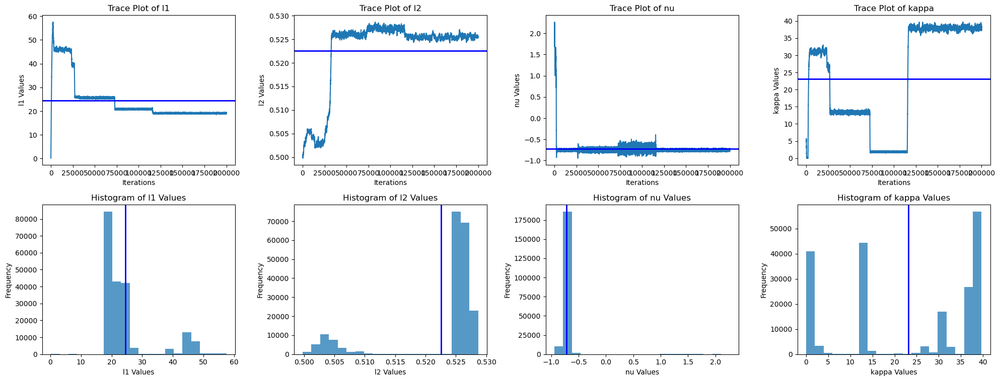

100%|██████████| 52/52 [00:00<00:00, 597.57it/s]


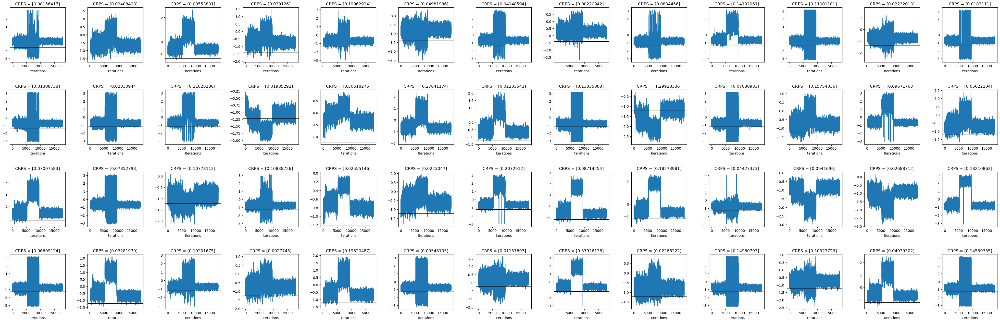

100%|██████████| 52/52 [00:00<00:00, 105.92it/s]


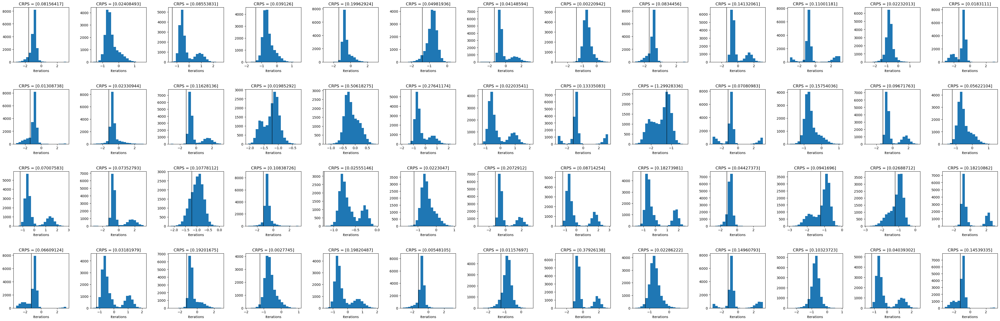

C:\Users\97252\AppData\Local\Temp\ipykernel_2488\3991572658.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(label)


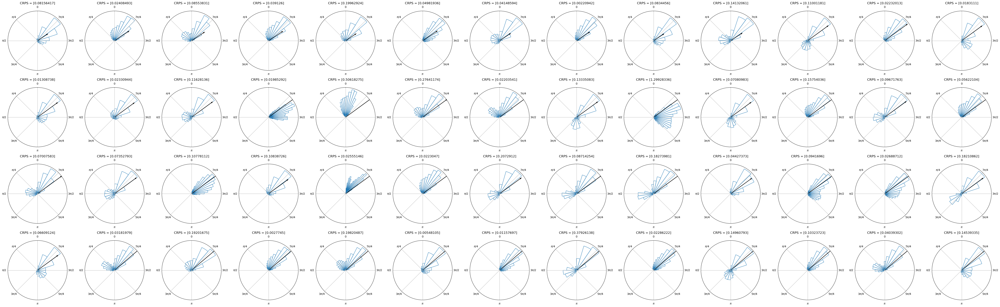

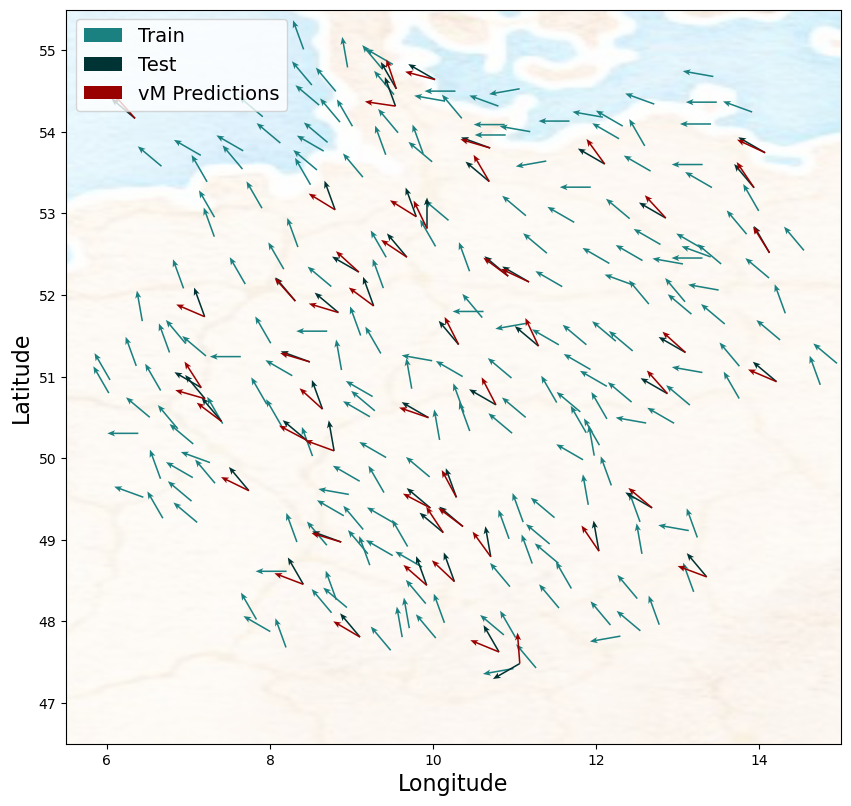

In [ ]:
#### Plot Map Von Mises ####
############################

bins=20
num_rows = 4  # Number of rows in the grid
num_cols = 13   # Number of columns in the grid


def rose_plot(ax, angles, bins=32, density=None, offset=np.pi*0.5, lab_unit="degrees",
              start_zero=False, **param_dict):
    
    """
    Plot polar histogram of angles on ax. ax must have been created using
    subplot_kw=dict(projection='polar'). Angles are expected in radians.
    """
    # Wrap angles to [-pi, pi)
    #angles = (angles + np.pi) % (2*np.pi) - np.pi

    # Set bins symetrically around zero
    if start_zero:
        # To have a bin edge at zero use an even number of bins
        if bins % 2:
            bins += 1
        bins = np.linspace(-np.pi, np.pi, num=bins+1)

    # Bin data and record counts
    count, bin = np.histogram(angles, bins=bins)

    # Compute width of each bin
    widths = np.diff(bin)

    # By default plot density (frequency potentially misleading)
    if density is None or density is True:
        # Area to assign each bin
        area = count / angles.size
        # Calculate corresponding bin radius
        radius = (area / np.pi)**.5
    else:
        radius = count

    # Plot data on ax
    ax.bar(bin[:-1], radius, zorder=1, align='edge', width=widths,
           edgecolor='C0', fill=False, linewidth=1)

    # Set the direction of the zero angle
    ax.set_theta_offset(offset)

    # Remove ylabels, they are mostly obstructive and not informative
    ax.set_yticks([])

    if lab_unit == "radians":
        label = ['$0$', r'$\pi/4$', r'$\pi/2$', r'$3\pi/4$',
                  r'$\pi$', r'$5\pi/4$', r'$3\pi/2$', r'$7\pi/4$']
        ax.set_xticklabels(label)
        

fig, axs = plt.subplots(2, 4, figsize=(20, 8))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Trace of l1
axes = axs[0, 0]
axes.plot(samples.l1s[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('l1 Values')
axes.set_title('Trace Plot of l1')
axes.axhline(np.mean(samples.l1s[:i]), color='b', linewidth=2)


# Trace of l2
axes = axs[0, 1]
axes.plot(samples.l2s[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('l2 Values')
axes.set_title('Trace Plot of l2')
axes.axhline(np.mean(samples.l2s[:i]), color='b', linewidth=2)




# Histogram of l1

axes = axs[1, 0]
axes.hist(samples.l1s[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.l1s[:i]), color='b', linewidth=2)
axes.set_xlabel('l1 Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of l1 Values')

# Histogram of l2
axes = axs[1, 1]
axes.hist(samples.l2s[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.l2s[:i]), color='b', linewidth=2)
axes.set_xlabel('l2 Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of l2 Values')



# Trace and histogram of kappas
axes = axs[0, 3]
axes.plot(samples.kappas[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('kappa Values')
axes.set_title('Trace Plot of kappa')
axes.axhline(np.mean(samples.kappas[:i]), color='b', linewidth=2)

axes = axs[1, 3]
axes.hist(samples.kappas[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.kappas[:i]), color='b', linewidth=2)
axes.set_xlabel('kappa Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of kappa Values')

# Trace and histogram of nus
axes = axs[0, 2]
axes.plot(samples.nus[:i])
axes.set_xlabel('Iterations')
axes.set_ylabel('nu Values')
axes.set_title('Trace Plot of nu')
axes.axhline(np.mean(samples.nus[:i]), color='b', linewidth=2)

axes = axs[1, 2]
axes.hist(samples.nus[:i], alpha=0.75, bins=bins)
axes.axvline(np.mean(samples.nus[:i]), color='b', linewidth=2)
axes.set_xlabel('nu Values')
axes.set_ylabel('Frequency')
axes.set_title('Histogram of nu Values')


plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()






fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in tqdm(range(len(axs))):
    axs[p].plot(testPredVonMises_10th_row[p,:])  # Plot data for the i-th dimension
    axs[p].set_xlabel('Iterations')
    axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')  
    # add bar to show the observed direction
    axs[p].axhline(test_ys[p], color='black', linewidth=1)  

    #axs[p].set_title(f'dim {p+1}, CRPS = {CRPS_vec_VM[p,:]}')  # Assuming dimensions are indexed from 1 to 52


plt.show()

fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in tqdm(range(len(axs))):
    axs[p].hist(testPredVonMises_10th_row[p,:], bins = bins)  # Plot data for the i-th dimension
    axs[p].set_xlabel('Iterations')
    axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')
    # add bar to show the observed direction
    axs[p].axvline(test_ys[p], color='black', linewidth=1)


plt.show()



fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*4, num_rows*4), subplot_kw=dict(projection='polar'))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Flatten the axs array for easy iteration
axs = axs.flatten()

for p in range(len(axs)):
    
    rose_plot(axs[p], testPredVonMises_10th_row[p,:] , lab_unit="radians",bins = bins)
    #axs[p].set_title(f'dim {p+1}, CRPS = {CRPS_vec_VM[p]}')          # Assuming dimensions are indexed from 1 to 52
    # add black quivar of the observed direction
    axs[p].quiver(0,0,np.sin(ys[p]), np.cos(ys[p]), color='black', scale=1, scale_units='xy', angles='xy')
    axs[p].set_title(f'CRPS = {CRPS_vec_VM[p]}')



plt.tight_layout()  # Adjust layout to prevent overlap of subplots

plt.show()

import matplotlib.font_manager as font_manager

img = plt.imread("germanyMap4.png")

bins = 50

scale = 25
headlength2 = 5
headwidth2 = 4
width2 = 0.002
headaxislength2 = headlength2 - 1


 
# Plot the circular mean and variance of the posterior
y_circmean_VM = stats.circmean(testPredVonMises, high=2 * np.pi, low=0, axis=0)


# Convert observed and predicted direction for visualization
observed_directions = -np.cos(ys_all) - 1j * np.sin(ys_all)  
predicted_directions_VM = -np.cos(y_circmean_VM) - 1j * np.sin(y_circmean_VM)  


#################
## Quiver Plot ###
#################

# Define softer colors
dteal =  (0.0, 0.2, 0.2)   # Darker teal
dark_red = (0.6, 0.0, 0.0)   # Dark red
# ligt teal
lteal =  (0.1, 0.5, 0.5)   # Darker teal


alpha_img = 0.2

fig, ax = plt.subplots(figsize=(10, 15))
#dark = '#1f77b4'

ax.quiver(combined_xs[ind_obs, 0], combined_xs[ind_obs, 1], observed_directions[ind_obs].real, observed_directions[ind_obs].imag, color=lteal, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2 , scale=scale)

ax.quiver(combined_xs[ind_un, 0], combined_xs[ind_un, 1], observed_directions[ind_un].real, observed_directions[ind_un].imag, color=dteal, headaxislength=headaxislength2, headwidth=headwidth2, headlength=headlength2, width=width2 , scale=scale)

ax.quiver(combined_xs[ind_un, 0], combined_xs[ind_un, 1], predicted_directions_VM.real, predicted_directions_VM.imag, color=dark_red,headaxislength=headaxislength2, headwidth=headwidth2, width = width2, headlength=headlength2 , scale=scale)


ax.imshow(img, extent=[5.5, 15, 46.5, 55.5], alpha=alpha_img)


legend_font = font_manager.FontProperties(size=14)
#ax.set_title("Observed vs. Predicted Wind Directions", fontsize=18, fontweight='bold', pad=30)  
ax.legend(['Train', 'Test', 'vM Predictions'], loc='upper left', bbox_to_anchor=(0, 1), prop=legend_font)
ax.set_xlabel('Longitude', fontsize=16) 
ax.set_ylabel('Latitude',  fontsize=16) 
ax.set_xlim(5.5, 15)
ax.set_ylim(46.5, 55.5)


plt.show()

In [ ]:
# Print Continuous Ranked Probability Score (CRPS) for all models' predictions
print("CRPS PN: ", resultPN.rx2('CRPS'))
print("CRPS WN: ", resultWN.rx2('CRPS'))
print("CRPS VM: ", resultVM.rx2('CRPS'))


CRPS PN:  [0.06154605]
CRPS WN:  [0.17545653]
CRPS VM:  [0.22045148]


In [ ]:
## R code for WN, PN, CRPS ##
#############################

# Define R parameters
PN_iter = 30000 # N of Projected Normal iterations
WN_iter = 20000 # N of Wrraped Normal iterations
burnin_PN = 5000
burnin_WN = 5000
end_adapt_PN = 2000 # Should be smaller than burnin_PN
end_adapt_WN = 2000 # Should be smaller than burnin_WN
start_adapt_WN = 100 # When to start the adaptation
start_adapt_PN = 100 # When to start the adaptation


# Reactivate conversion between pandas and R dataframes
pandas2ri.activate()
numpy2ri.activate()

# Read and load necessary R libraries
r_library = r['library']
r_libraries = ['CircSpaceTime', 'PBSmapping', 'gridExtra', 'ggplot2', 'ggmap']
for lib in r_libraries:
    r_library(lib)



## Initialize R  data sets ##
#############################


dd3 = xs
gr = pred_xs
testYs = test_ys
tYs = testYs.transpose()

tYsT = tYs.transpose().reshape((tYs.shape[0], 1))



tYsT_r = r['c'](tYsT.flatten())

# Convert xs, pred_xs to DataFrames with column names "X" and "Y"
dd3 = pd.DataFrame(xs, columns=["X", "Y"])
gr = pd.DataFrame(pred_xs, columns=["X", "Y"])


# Pass Python variables to the R global environment

robjects.globalenv['data1'] = dd3
robjects.globalenv['gr'] = gr
robjects.globalenv['testYs'] = testYs
robjects.globalenv['tYs'] = testYs
robjects.globalenv['train_ys'] = pd.DataFrame(ys.reshape((ys.shape[0],1)), columns=["ys"])
robjects.globalenv['PN_iter'] = PN_iter
robjects.globalenv['WN_iter'] = WN_iter
robjects.globalenv['burnin_PN'] = burnin_PN
robjects.globalenv['burnin_WN'] = burnin_WN
robjects.globalenv['end_adapt_PN'] = end_adapt_PN
robjects.globalenv['end_adapt_WN'] = end_adapt_WN
robjects.globalenv['start_adapt_PN'] = start_adapt_PN
robjects.globalenv['start_adapt_WN'] = start_adapt_WN
robjects.globalenv['coords_nobs'] = gr
robjects.globalenv['coords'] = dd3


r_code = """
distance_matrix <- dist(coords)
rho_max <- 3./min(distance_matrix[which(distance_matrix > 0)])
rho_min <- 3./max(distance_matrix[which(distance_matrix > 0)])
"""

# Execute the R code
r(r_code)



R[write to console]: 
-----------------------------------------------------------
PBS Mapping 2.73.4 -- Copyright (C) 2003-2024 Fisheries and Oceans Canada

PBS Mapping comes with ABSOLUTELY NO WARRANTY;
for details see the file COPYING.
This is free software, and you are welcome to redistribute
it under certain conditions, as outlined in the above file.

A complete user guide 'PBSmapping-UG.pdf' is located at 
C:/Users/97252/AppData/Local/R/win-library/4.3/PBSmapping/doc/PBSmapping-UG.pdf

Packaged on 2023-11-03
Pacific Biological Station, Nanaimo

All available PBS packages can be found at
https://github.com/pbs-software

To see demos, type '.PBSfigs()'.
Note: function 'importShapefile()' is temporarily unavailable.
-----------------------------------------------------------



R[write to console]: Want to understand how all the pieces fit together? Read R for Data
Science: https://r4ds.had.co.nz/



i Google's Terms of Service: <https://mapsplatform.google.com>
  Stadia Maps' Terms of Service: <https://stadiamaps.com/terms-of-service/>
  OpenStreetMap's Tile Usage Policy: <https://operations.osmfoundation.org/policies/tiles/>
i Please cite ggmap if you use it! Use `citation("ggmap")` for details.


In [ ]:
## CRPS Von Mises ##
####################

# Von Mises Traces circular hists
N_burnin = 2000

testPredVonMises = samples.angles[ind_un, N_burnin : ].T
# Extract every 10th row
testPredVonMises_10th_row = testPredVonMises[::10].T 
# CRPScirc function for Von Mises predictions
resultVM = r['CRPScirc'](tYsT_r, testPredVonMises_10th_row, bycol=False)
print("result VM: ", resultVM)
CRPS_vec_VM = resultVM.rx2('CRPS')
print("CRPS VM: ", resultVM.rx2('CRPS'))
CRPS_vec_VM = resultVM.rx2('CRPSvec')
print("Max CRPS VM: ", np.max(resultVM.rx2('CRPSvec')))
test_ys = np.array(ys_all)


result VM:  $CRPSvec
             [,1]
 [1,] 0.020972987
 [2,] 0.008950071
 [3,] 0.131349428
 [4,] 0.043140884
 [5,] 0.113936706
 [6,] 0.025603696
 [7,] 0.019872225
 [8,] 0.016038007
 [9,] 0.192273700
[10,] 0.010102179
[11,] 0.017358806
[12,] 0.017192229
[13,] 0.045125062
[14,] 0.011154298
[15,] 0.057325712
[16,] 0.009926751
[17,] 0.429331122
[18,] 0.182552033
[19,] 0.076577755
[20,] 0.083270818
[21,] 0.010207066
[22,] 0.696199173
[23,] 0.036396688
[24,] 0.450241295
[25,] 0.002079616
[26,] 0.001617579
[27,] 0.017789825
[28,] 0.001312277
[29,] 0.083290024
[30,] 0.230254440
[31,] 1.949743683
[32,] 0.043398184
[33,] 0.036968419
[34,] 0.017285380
[35,] 0.436768356
[36,] 0.024924549
[37,] 0.379479036
[38,] 0.007712066
[39,] 0.243725669
[40,] 0.001343507
[41,] 0.110457114
[42,] 0.091855658
[43,] 0.030891033
[44,] 0.009915706
[45,] 0.001707714
[46,] 0.001367197
[47,] 0.087205762
[48,] 0.006537224
[49,] 0.184796036
[50,] 0.095897354
[51,] 0.027786669
[52,] 0.170402899

$CRPS
[1] 0.1346464


CR

In [ ]:
## Wrraped Normal ##
####################

r_code = """
set.seed(12345)

start1 <- list(
  "alpha" = c(2*pi,3.14),
  "rho" = c(.5*(rho_min + rho_max),.1*(rho_min + rho_max)),
  "sigma2" = c(0.1,1),
  "k" = c(rep(0, nrow(data1)),rep(0, nrow(data1)))
)

data1.post <- WrapSp(
    x = train_ys$ys, 
    coords = coords,
    start = start1,
    priors = list("alpha" = c(pi,10),
                  "rho" = c(rho_min, rho_max),
                  "sigma2" = c(3,0.5)),
    sd_prop = list("sigma2" = 1,
                   "rho" = 0.3),
    iter = WN_iter,
    BurninThin = c(burnin = burnin_WN,
                   thin = 10),
    accept_ratio = 0.5,
    adapt_param = c(start = start_adapt_WN,
                    end = end_adapt_WN,
                    exp = 0.8),
    corr_fun = "exponential",
    n_chains = 2,
    parallel = TRUE ,
    n_cores = 2
)
Pred.data1 <- WrapKrigSp(WrapSp_out = data1.post,
                         coords_obs = coords,
                         coords_nobs = coords_nobs,
                         x_obs = train_ys$ys
)

Pred.data1$Prev_out
"""

# Execute the R code and retrieve the results
Pred_data1 = robjects.r(r_code)
print("WN WrapSp result:", Pred_data1)

Pred_data1T = Pred_data1.T

Pred_data1_every_10 = Pred_data1T[::10].T


# CRPScirc function for Wrraped Normal preditions
resultWN = r['CRPScirc'](tYsT_r, Pred_data1_every_10, bycol=False)

print("result WN: ", resultWN)
print("CRPS WN: ", resultWN.rx2('CRPS'))



WN WrapSp result: [[5.86159887 5.76559495 5.77348272 ... 5.73857621 5.8965102  6.07974748]
 [5.28615845 5.22088897 4.87029546 ... 5.38092227 5.12501472 5.14177147]
 [5.45458459 5.3165366  5.42570174 ... 4.60436422 5.29308282 5.35495179]
 ...
 [4.48430666 4.58368471 4.71796126 ... 4.5741952  4.42403198 5.01827262]
 [5.15919243 5.55226626 5.35146233 ... 5.12352499 5.40124854 5.445009  ]
 [5.93402242 4.81835657 5.19753393 ... 4.90908859 5.62563367 5.7559134 ]]
result WN:  $CRPSvec
             [,1]
 [1,] 0.062706243
 [2,] 0.266292845
 [3,] 0.047310125
 [4,] 0.134867404
 [5,] 0.085572012
 [6,] 0.111401343
 [7,] 0.535480970
 [8,] 0.455373047
 [9,] 0.023603085
[10,] 0.287020466
[11,] 0.379479205
[12,] 0.171138808
[13,] 0.021412314
[14,] 0.184150257
[15,] 0.415183091
[16,] 0.269133168
[17,] 0.007577123
[18,] 0.009197739
[19,] 0.020750712
[20,] 0.182142229
[21,] 0.011532035
[22,] 0.341497341
[23,] 0.100695741
[24,] 0.025346649
[25,] 0.351602302
[26,] 0.155685957
[27,] 0.120672174
[28,] 0.17468

OSError: Cannot save file into a non-existent directory: 'C:\Users\97252\Desktop\vMQ\data_calm'

Pred_krig_PN: [[5.1094725  2.16757137 5.40164135 ... 5.90325621 5.99314492 0.34518895]
 [5.20028665 5.54507039 5.33072071 ... 5.44278995 5.05125229 4.83762816]
 [5.38907403 5.45126689 0.05251299 ... 5.53362115 5.25073967 5.90389196]
 ...
 [5.85541044 5.41068429 5.897976   ... 5.52027359 0.52610971 5.22509436]
 [4.7437358  5.8021984  4.24133688 ... 5.40791969 5.23604937 5.43515326]
 [4.85469396 5.4127465  5.2189931  ... 5.86857306 5.78948006 5.40358657]]
result PN:  $CRPSvec
             [,1]
 [1,] 0.062950298
 [2,] 0.006232165
 [3,] 0.010643243
 [4,] 0.017389055
 [5,] 0.020463857
 [6,] 0.005567229
 [7,] 0.007880141
 [8,] 0.015640215
 [9,] 0.047084502
[10,] 0.058852101
[11,] 0.007114468
[12,] 0.003524341
[13,] 0.026749302
[14,] 0.027923397
[15,] 0.098920702
[16,] 0.003321904
[17,] 0.041444587
[18,] 0.078392259
[19,] 0.022191497
[20,] 0.005300800
[21,] 0.069596143
[22,] 0.312795188
[23,] 0.058467826
[24,] 0.016725457
[25,] 0.031138778
[26,] 0.015618533
[27,] 0.069836416
[28,] 0.068867787

C:\Users\97252\AppData\Local\Temp\ipykernel_12672\3664583400.py:189: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(label)


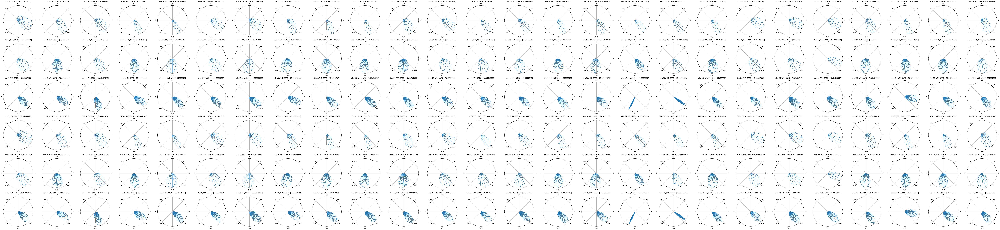

In [ ]:

# Define the folder path for saving processed data
folder_path = "C:\\Users\\97252\\Desktop\\vMQP\\calm"  # Specify your folder path here

file_path_WN = os.path.join(folder_path,f"testPred_WN_calm.csv")
pd.DataFrame(Pred_data1).to_csv(file_path_WN, index=False)

CRPS_vec_WN = resultWN.rx2('CRPSvec')








## Projected Normal ##
######################
 

r_code = """
set.seed(12345)

start_PN <- list(
  "alpha" = c(pi, pi/4, pi/2, 2*pi),
  "tau" = c(-0.12,-0.1),
  "rho" = c(1.0,0.6),
  "sigma2" = c(1,0.1),
  "r" = abs(rnorm(nrow(data1)))
)

##### be careful in the prior’s choice
data1_PN <- ProjSp(
  x = train_ys$ys,
  coords = coords,
  start = start_PN ,
  priors = list("rho" = c(rho_min,rho_max+0.001),
                "tau" = c(-1,1),
                "sigma2" = c(3,2),
                "alpha_mu" = c(pi/3, pi*2/3),
                "alpha_sigma" = diag(20,2)),
  sd_prop = list("sigma2" = .1,
                 "tau" = .1,
                 "rho" = .1,
                 "sdr" = rep(.01,nrow(data1))),
  iter = PN_iter,
  BurninThin = c(burnin = burnin_PN, thin = 10),
  accept_ratio = 0.234,
  adapt_param = c(start = start_adapt_PN, end = end_adapt_PN, exp = 0.5),
  corr_fun = "exponential",
  n_chains = 2 ,
  parallel = TRUE ,
  n_cores = 2)


Pred.krig_PN <- ProjKrigSp(ProjSp_out = data1_PN,
                           coords_obs = coords,
                           coords_nobs = coords_nobs,
                           x_obs = train_ys$ys)


Pred.krig_PN$Prev_out
"""

# Execute the R code and retrieve the results
Pred_krig_PN  = r(r_code)
print("Pred_krig_PN:", Pred_krig_PN)


Pred_krig_PNT = Pred_krig_PN.T

Pred_krig_PN_every_10 = Pred_krig_PNT[::10].T


# CRPScirc function for Wrraped Normal preditions
resultPN = r['CRPScirc'](tYsT_r, Pred_krig_PN_every_10, bycol=False)



file_path_PN = os.path.join(folder_path,f"testPred_PN_calm.csv")
pd.DataFrame(Pred_krig_PN).to_csv(file_path_PN, index=False)

# Use CRPScirc function for PN predictions
print("result PN: ", resultPN)


# Print Continuous Ranked Probability Score (CRPS) for all models' predictions
print("CRPS PN: ", resultPN.rx2('CRPS'))
print("CRPS WN: ", resultWN.rx2('CRPS'))
print("CRPS VM: ", resultVM.rx2('CRPS'))


CRPS_vec_PN = resultPN.rx2('CRPSvec')




# Plot  circular hists + CRPSs

pn_pred = Pred_krig_PN 
wn_pred = Pred_data1
vm_pred = testPredVonMises_10th_row
bins = 50
i=0
j=0

# Flatten the axs array for easy iteration
modles = [pn_pred, wn_pred, vm_pred]
names = ["PN", "WN", "VM"]
CRPSs = [CRPS_vec_PN,CRPS_vec_WN,CRPS_vec_VM]

num_modles = len(modles)
num_rows = num_modles*2  # Number of rows in the grid (total 52 dimensions, so 13x4 grid)
num_cols = 26   # Number of columns in the grid

fig_size = 4

fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*fig_size, num_rows*fig_size), subplot_kw=dict(projection='polar'))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

for j in range(num_modles):
    for i in range(num_cols):
        
        rose_plot(axs[j,i], modles[j][i, :], lab_unit="radians")
        rose_plot(axs[j+num_modles,i], modles[j][i, :], lab_unit="radians")
        axs[j,i].set_title(f'dim {i+1}, {names[j]}, CRPS = {CRPSs[j][i]}') 
        axs[j+num_modles,i].set_title(f'dim {i+1}, {names[j]}, CRPS = {CRPSs[j][i+num_cols]}')   
        


plt.tight_layout()  # Adjust layout to prevent overlap of subplots

plt.show()

